In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize']=(12,5)
plt.rcParams['figure.dpi']=300
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

In [2]:
wine = pd.read_csv(r"C:\Users\ACS\OneDrive\Desktop\data sets\wine.csv")
wine

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
0,1,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,1,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,1,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,1,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,3,13.71,5.65,2.45,20.5,95,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740
174,3,13.40,3.91,2.48,23.0,102,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750
175,3,13.27,4.28,2.26,20.0,120,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835
176,3,13.17,2.59,2.37,20.0,120,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840


In [3]:
wine.describe()

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
count,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000
mean,1.938202,13.000618,2.336348,2.366517,19.494944,99.741573,2.295112,2.029270,0.361854,1.590899,5.058090,0.957449,2.611685,746.893258
std,0.775035,0.811827,1.117146,0.274344,3.339564,14.282484,0.625851,0.998859,0.124453,0.572359,2.318286,0.228572,0.709990,314.907474
min,1.000000,11.030000,0.740000,1.360000,10.600000,70.000000,0.980000,0.340000,0.130000,0.410000,1.280000,0.480000,1.270000,278.000000
25%,1.000000,12.362500,1.602500,2.210000,17.200000,88.000000,1.742500,1.205000,0.270000,1.250000,3.220000,0.782500,1.937500,500.500000
50%,2.000000,13.050000,1.865000,2.360000,19.500000,98.000000,2.355000,2.135000,0.340000,1.555000,4.690000,0.965000,2.780000,673.500000
75%,3.000000,13.677500,3.082500,2.557500,21.500000,107.000000,2.800000,2.875000,0.437500,1.950000,6.200000,1.120000,3.170000,985.000000
max,3.000000,14.830000,5.800000,3.230000,30.000000,162.000000,3.880000,5.080000,0.660000,3.580000,13.000000,1.710000,4.000000,1680.000000


In [4]:
wine.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 178 entries, 0 to 177
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Type             178 non-null    int64  
 1   Alcohol          178 non-null    float64
 2   Malic            178 non-null    float64
 3   Ash              178 non-null    float64
 4   Alcalinity       178 non-null    float64
 5   Magnesium        178 non-null    int64  
 6   Phenols          178 non-null    float64
 7   Flavanoids       178 non-null    float64
 8   Nonflavanoids    178 non-null    float64
 9   Proanthocyanins  178 non-null    float64
 10  Color            178 non-null    float64
 11  Hue              178 non-null    float64
 12  Dilution         178 non-null    float64
 13  Proline          178 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 19.6 KB


In [5]:
wine.duplicated().sum()  # no duplicates

0

In [6]:
wine.isna().sum() #no null values

Type               0
Alcohol            0
Malic              0
Ash                0
Alcalinity         0
Magnesium          0
Phenols            0
Flavanoids         0
Nonflavanoids      0
Proanthocyanins    0
Color              0
Hue                0
Dilution           0
Proline            0
dtype: int64

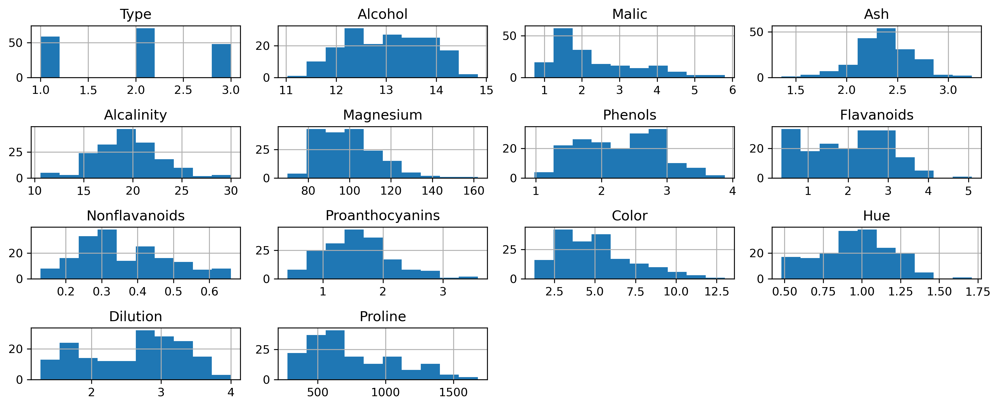

In [7]:
wine.hist()
plt.tight_layout() #we can observe skewness in them

<Axes: >

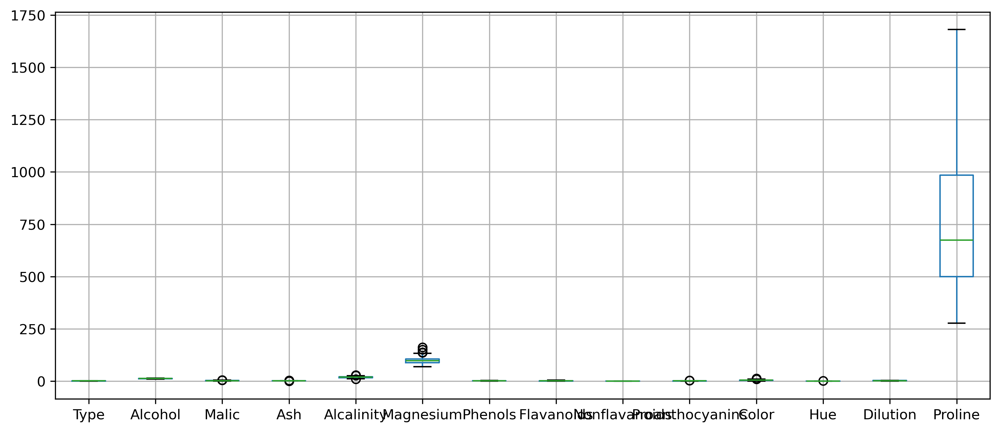

In [8]:
wine.boxplot() #presence of outliers confirmed

<Axes: xlabel='Proanthocyanins'>

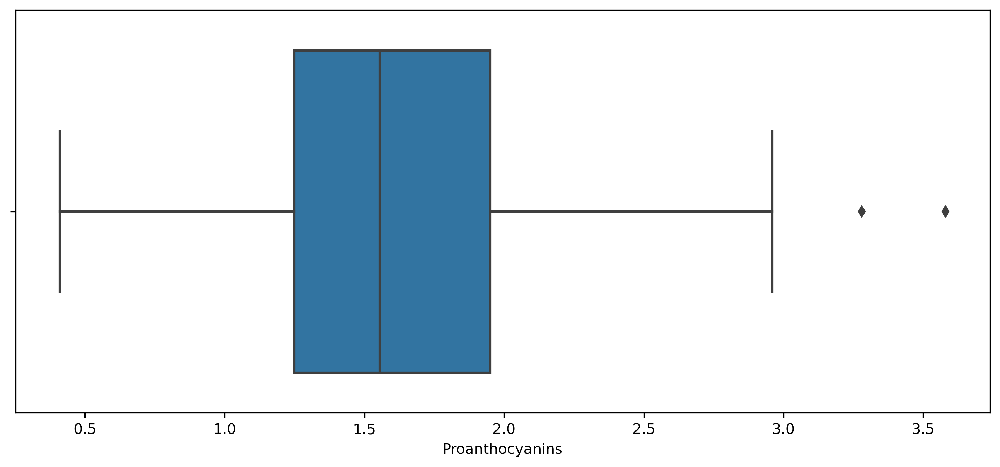

In [9]:
sns.boxplot(x = wine['Proanthocyanins'])

In [10]:
def outlier_detection(data,colname):  #user defined function to treat outliers
  q1 = data[colname].quantile(0.25)
  q3 = data[colname].quantile(0.75)
  iqr = q3 - q1

  upper_extreme = q3 + (1.5 * iqr)
  lower_extreme = q1 - (1.5 * iqr)

  return lower_extreme, upper_extreme

In [11]:
outlier_detection(wine,wine.columns)

(Type                -2.00000
 Alcohol             10.39000
 Malic               -0.61750
 Ash                  1.68875
 Alcalinity          10.75000
 Magnesium           59.50000
 Phenols              0.15625
 Flavanoids          -1.30000
 Nonflavanoids        0.01875
 Proanthocyanins      0.20000
 Color               -1.25000
 Hue                  0.27625
 Dilution             0.08875
 Proline           -226.25000
 dtype: float64,
 Type                  6.00000
 Alcohol              15.65000
 Malic                 5.30250
 Ash                   3.07875
 Alcalinity           27.95000
 Magnesium           135.50000
 Phenols               4.38625
 Flavanoids            5.38000
 Nonflavanoids         0.68875
 Proanthocyanins       3.00000
 Color                10.67000
 Hue                   1.62625
 Dilution              5.01875
 Proline            1711.75000
 dtype: float64)

In [12]:
wine.loc[wine['Malic']>5.30250,'Malic'] =5.30250

In [13]:
wine.loc[wine['Ash']>3.07875,'Ash'] =3.07875
wine.loc[wine['Ash']<1.68875,'Ash'] =1.68875

In [14]:
wine.loc[wine['Alcalinity']>27.95000,'Alcalinity'] =27.95000
wine.loc[wine['Alcalinity']<10.75000,'Alcalinity'] =10.75000

In [15]:
wine.loc[wine['Magnesium']>135.50000,'Magnesium'] =135.50000

C:\Users\ACS\AppData\Local\Temp\ipykernel_17752\712410119.py:1: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '135.5' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  wine.loc[wine['Magnesium']>135.50000,'Magnesium'] =135.50000


In [16]:
wine.loc[wine['Proanthocyanins']>3.00000,'Proanthocyanins'] =3.00000

In [17]:
wine.loc[wine['Color']>10.67000,'Color'] =10.67000

In [18]:
wine.loc[wine['Hue']>1.62625,'Hue'] =1.62625

<Axes: >

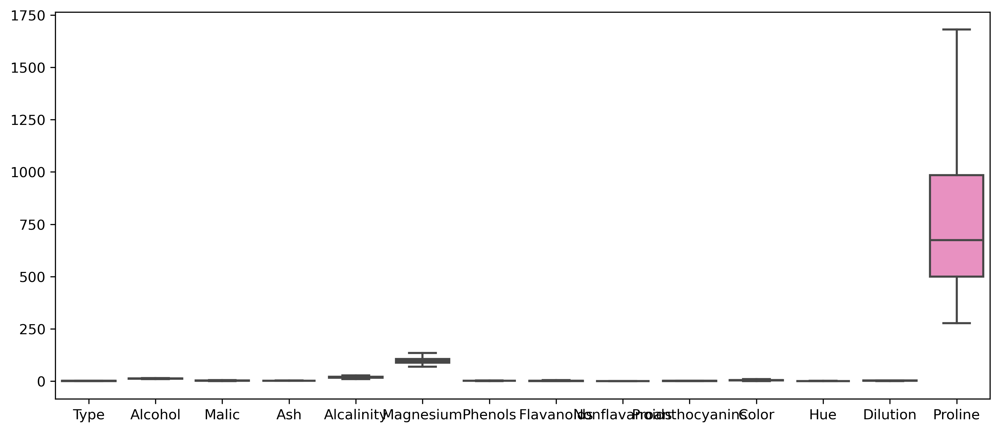

In [19]:
sns.boxplot(wine) # outliers treated

In [20]:
wine.corr()

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
Type,1.000000,-0.328222,0.440422,-0.047680,0.525608,-0.224264,-0.719163,-0.847498,0.489109,-0.512528,0.260260,-0.621549,-0.788230,-0.633717
Alcohol,-0.328222,1.000000,0.094756,0.220174,-0.312191,0.302173,0.289101,0.236815,-0.155929,0.153171,0.549107,-0.067156,0.072343,0.643720
Malic,0.440422,0.094756,1.000000,0.166614,0.295882,-0.039329,-0.339050,-0.414875,0.294203,-0.234575,0.264897,-0.566409,-0.372582,-0.191173
Ash,-0.047680,0.220174,0.166614,1.000000,0.427713,0.322510,0.124436,0.097562,0.183666,0.006080,0.256799,-0.075904,-0.011214,0.229676
Alcalinity,0.525608,-0.312191,0.295882,0.427713,1.000000,-0.098030,-0.333046,-0.363405,0.369276,-0.208794,0.009748,-0.286664,-0.287032,-0.448700
Magnesium,-0.224264,0.302173,-0.039329,0.322510,-0.098030,1.000000,0.227035,0.209431,-0.255674,0.201428,0.240505,0.040007,0.064019,0.411557
Phenols,-0.719163,0.289101,-0.339050,0.124436,-0.333046,0.227035,1.000000,0.864564,-0.449935,0.618771,-0.062101,0.435952,0.699949,0.498115
Flavanoids,-0.847498,0.236815,-0.414875,0.097562,-0.363405,0.209431,0.864564,1.000000,-0.537900,0.665384,-0.169807,0.546718,0.787194,0.494193
Nonflavanoids,0.489109,-0.155929,0.294203,0.183666,0.369276,-0.255674,-0.449935,-0.537900,1.000000,-0.368455,0.131596,-0.266995,-0.503270,-0.311385
Proanthocyanins,-0.512528,0.153171,-0.234575,0.006080,-0.208794,0.201428,0.618771,0.665384,-0.368455,1.000000,-0.032693,0.306289,0.530565,0.340562


<Axes: >

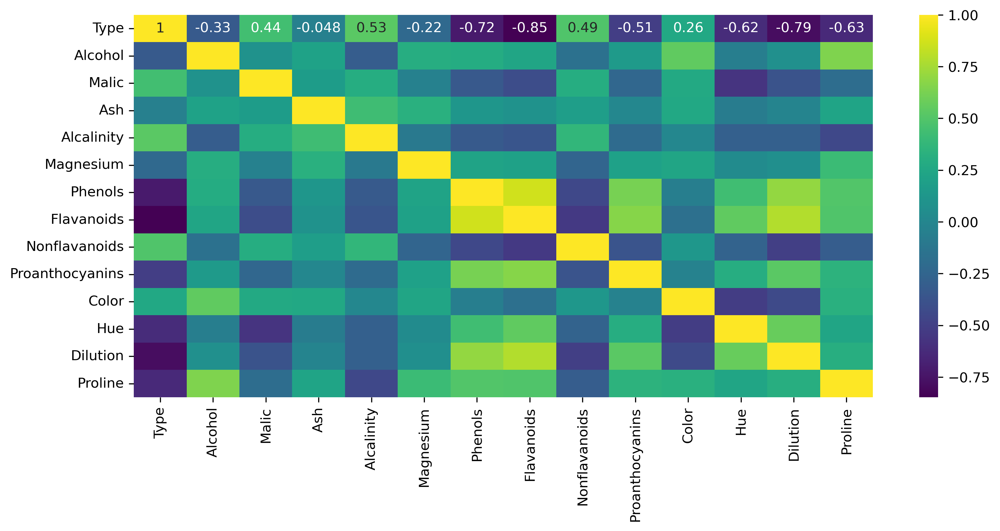

In [21]:
sns.heatmap(wine.corr(),annot=True,cmap='viridis')  #highest correlation in this is flavanoids and phenols

In [22]:
std=StandardScaler()
wine_normal = std.fit_transform(wine)
wine_normal

array([[-1.21394365,  1.51861254, -0.56553422, ...,  0.36660959,
         1.84791957,  1.01300893],
       [-1.21394365,  0.24628963, -0.50172839, ...,  0.41076822,
         1.1134493 ,  0.96524152],
       [-1.21394365,  0.19687903,  0.02694849, ...,  0.32245097,
         0.78858745,  1.39514818],
       ...,
       [ 1.37386437,  0.33275817,  1.77705125, ..., -1.6205284 ,
        -1.48544548,  0.28057537],
       [ 1.37386437,  0.20923168,  0.23659622, ..., -1.57636978,
        -1.40069891,  0.29649784],
       [ 1.37386437,  1.39508604,  1.61297912, ..., -1.53221115,
        -1.42894777, -0.59516041]])

In [23]:
pca=PCA()
pca_components = pca.fit_transform(wine_normal)

In [24]:
# The amount of variance that each PCA explains
pca.explained_variance_        # 1st column contains 5.60458768  variance .. upto 14th col contains 0.05699541 variance

array([5.60458768, 2.56375389, 1.42651378, 0.93195358, 0.84238847,
       0.66542266, 0.528459  , 0.3596558 , 0.29687634, 0.26475628,
       0.2295037 , 0.17366731, 0.13456214, 0.05699541])

In [25]:
# in percentage - The amount of variance that each PCA explains is
var=pca.explained_variance_ratio_
var

array([0.39807866, 0.18209648, 0.1013214 , 0.06619413, 0.05983257,
       0.04726317, 0.03753501, 0.02554538, 0.02108632, 0.01880492,
       0.01630103, 0.01233512, 0.00955758, 0.00404823])

In [26]:
# Cumulative variance
var1=np.cumsum(np.round(var,decimals=4)*100)
var1

array([39.81, 58.02, 68.15, 74.77, 80.75, 85.48, 89.23, 91.78, 93.89,
       95.77, 97.4 , 98.63, 99.59, 99.99])

In [27]:
pca.components_

array([[ 0.39251008, -0.1377818 ,  0.22329763, -0.0009843 ,  0.22883621,
        -0.1251569 , -0.3582432 , -0.38964643,  0.2657193 , -0.28231773,
         0.08669661, -0.27694181, -0.34904433, -0.26933504],
       [-0.00496269, -0.47689882, -0.22541809, -0.31850888,  0.01538238,
        -0.32622521, -0.06153297,  0.0046166 , -0.02489123, -0.03214222,
        -0.52494506,  0.27227014,  0.16469922, -0.36240539],
       [-0.00556301, -0.2019702 ,  0.08624025,  0.62967078,  0.60797016,
         0.13384644,  0.14846374,  0.14788287,  0.17454208,  0.1418448 ,
        -0.15115795,  0.08845697,  0.16545227, -0.12315971],
       [ 0.10939511, -0.04501331,  0.47958192, -0.23727958,  0.09015793,
        -0.24398484,  0.20632743,  0.16082381, -0.27473055,  0.45692538,
         0.08862819, -0.43091896,  0.171825  , -0.23724698],
       [ 0.15361959, -0.26742089, -0.12432757, -0.08938002,  0.05741038,
         0.72452605, -0.11839535, -0.07800838, -0.54108981,  0.04311116,
        -0.05237197, -0.09

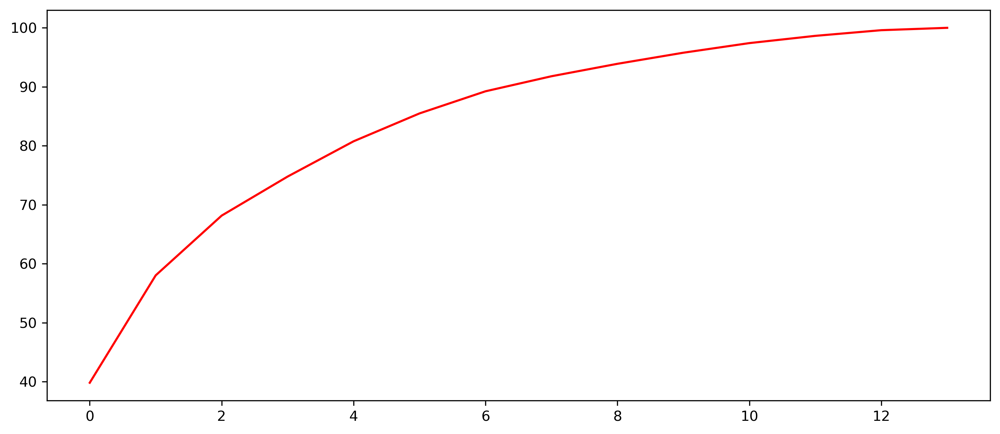

In [28]:
plt.plot(var1,color='red')  # var1 is cumulative percentage on y axis and index on x axis
# looking at graph you can decide how much percentage you want and accordingly go for that much column numbers

In [29]:
import seaborn as sns
sns.pairplot(wine)   # can check scatterplot with original dataset and see the difference

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

In [30]:
sns.pairplot(pd.DataFrame(pca_components))
#After applying PCA there should not be any correlation. Thus multicollinearity is removed or not that you can cross check.

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

**K Means clustering on original dataset**


In [31]:
from sklearn.cluster import KMeans

In [32]:
wine

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
0,1,14.23,1.7100,2.43,15.6,127.0,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,1,13.20,1.7800,2.14,11.2,100.0,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,1,13.16,2.3600,2.67,18.6,101.0,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,1,14.37,1.9500,2.50,16.8,113.0,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,1,13.24,2.5900,2.87,21.0,118.0,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,3,13.71,5.3025,2.45,20.5,95.0,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740
174,3,13.40,3.9100,2.48,23.0,102.0,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750
175,3,13.27,4.2800,2.26,20.0,120.0,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835
176,3,13.17,2.5900,2.37,20.0,120.0,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840


In [33]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled_wine_df = scaler.fit_transform(wine.iloc[:,1:])
scaled_wine_df

array([[ 1.51861254, -0.56553422,  0.24064008, ...,  0.36660959,
         1.84791957,  1.01300893],
       [ 0.24628963, -0.50172839, -0.86217567, ...,  0.41076822,
         1.1134493 ,  0.96524152],
       [ 0.19687903,  0.02694849,  1.15331518, ...,  0.32245097,
         0.78858745,  1.39514818],
       ...,
       [ 0.33275817,  1.77705125, -0.40583812, ..., -1.6205284 ,
        -1.48544548,  0.28057537],
       [ 0.20923168,  0.23659622,  0.0124713 , ..., -1.57636978,
        -1.40069891,  0.29649784],
       [ 1.39508604,  1.61297912,  1.41951209, ..., -1.53221115,
        -1.42894777, -0.59516041]])

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environme

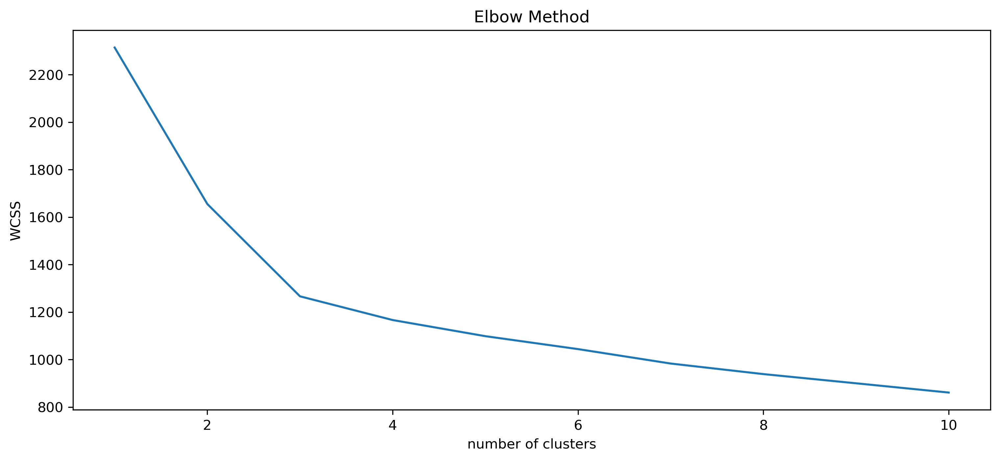

In [34]:
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i,init='k-means++',max_iter=300,random_state=0)
    kmeans.fit(scaled_wine_df)
    wcss.append(kmeans.inertia_)

plt.plot(range(1,11),wcss)
plt.title('Elbow Method')
plt.xlabel("number of clusters")
plt.ylabel('WCSS')
plt.show()

In [35]:
wcss

[2314.0,
 1654.9060813507995,
 1266.070346209317,
 1166.2027364061353,
 1098.2635825313503,
 1043.7959115877109,
 983.0010145035936,
 938.5460197925221,
 899.7957439072788,
 860.8127343971912]

In [36]:
kmeans = KMeans(n_clusters=4,random_state=0)
predict=kmeans.fit_predict(scaled_wine_df)

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


In [37]:
predict

array([3, 3, 3, 3, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2,
       3, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 3, 2,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 1, 1, 1, 1, 2, 1, 2,
       2, 1, 1, 2, 1, 2, 1, 2, 2, 1, 1, 1, 2, 2, 1, 2, 1, 0, 2, 1, 1, 1,
       1, 1, 1, 1, 1, 2, 2, 2, 2, 1, 2, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 2,
       2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 2, 1, 1, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0])

In [38]:
clusters_new = KMeans(n_clusters=3, random_state=0)
new_predict=clusters_new.fit_predict(scaled_wine_df)

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


In [39]:
clusters_new.labels_

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 2, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2])

In [40]:
new_predict


array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 2, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2])

In [41]:
wine['Clusterid']=new_predict

In [42]:
wine

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline,Clusterid
0,1,14.23,1.7100,2.43,15.6,127.0,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065,1
1,1,13.20,1.7800,2.14,11.2,100.0,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050,1
2,1,13.16,2.3600,2.67,18.6,101.0,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185,1
3,1,14.37,1.9500,2.50,16.8,113.0,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480,1
4,1,13.24,2.5900,2.87,21.0,118.0,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,3,13.71,5.3025,2.45,20.5,95.0,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740,2
174,3,13.40,3.9100,2.48,23.0,102.0,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750,2
175,3,13.27,4.2800,2.26,20.0,120.0,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835,2
176,3,13.17,2.5900,2.37,20.0,120.0,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840,2


In [43]:
wine.groupby('Clusterid').agg(['mean']).reset_index()


,Clusterid,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
,,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
0,0,2.000000,12.250923,1.889731,2.236288,20.056923,92.492308,2.247692,2.050000,0.357692,1.615231,2.973077,1.061419,2.803385,510.169231
1,1,1.048387,13.676774,1.997903,2.461573,17.420968,107.483871,2.847581,3.003226,0.292097,1.917581,5.453548,1.065484,3.163387,1100.225806
2,2,2.941176,13.134118,3.296373,2.417647,21.241176,98.666667,1.683922,0.818824,0.451961,1.145882,7.165098,0.691961,1.696667,619.058824


In [44]:
wine[wine['Clusterid']==0]

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline,Clusterid
59,2,12.37,0.94,1.68875,10.75,88.0,1.98,0.57,0.28,0.42,1.95,1.05,1.82,520,0
60,2,12.33,1.10,2.28000,16.00,101.0,2.05,1.09,0.63,0.41,3.27,1.25,1.67,680,0
62,2,13.67,1.25,1.92000,18.00,94.0,2.10,1.79,0.32,0.73,3.80,1.23,2.46,630,0
63,2,12.37,1.13,2.16000,19.00,87.0,3.50,3.10,0.19,1.87,4.45,1.22,2.87,420,0
64,2,12.17,1.45,2.53000,19.00,104.0,1.89,1.75,0.45,1.03,2.95,1.45,2.23,355,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125,2,12.07,2.16,2.17000,21.00,85.0,2.60,2.65,0.37,1.35,2.76,0.86,3.28,378,0
126,2,12.43,1.53,2.29000,21.50,86.0,2.74,3.15,0.39,1.77,3.94,0.69,2.84,352,0
127,2,11.79,2.13,2.78000,27.95,92.0,2.13,2.24,0.58,1.76,3.00,0.97,2.44,466,0
128,2,12.37,1.63,2.30000,24.50,88.0,2.22,2.45,0.40,1.90,2.12,0.89,2.78,342,0


In [45]:
wine.corr()

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline,Clusterid
Type,1.000000,-0.328222,0.440422,-0.047680,0.525608,-0.224264,-0.719163,-0.847498,0.489109,-0.512528,0.260260,-0.621549,-0.788230,-0.633717,0.426458
Alcohol,-0.328222,1.000000,0.094756,0.220174,-0.312191,0.302173,0.289101,0.236815,-0.155929,0.153171,0.549107,-0.067156,0.072343,0.643720,0.479720
Malic,0.440422,0.094756,1.000000,0.166614,0.295882,-0.039329,-0.339050,-0.414875,0.294203,-0.234575,0.264897,-0.566409,-0.372582,-0.191173,0.496569
Ash,-0.047680,0.220174,0.166614,1.000000,0.427713,0.322510,0.124436,0.097562,0.183666,0.006080,0.256799,-0.075904,-0.011214,0.229676,0.294506
Alcalinity,0.525608,-0.312191,0.295882,0.427713,1.000000,-0.098030,-0.333046,-0.363405,0.369276,-0.208794,0.009748,-0.286664,-0.287032,-0.448700,0.111532
Magnesium,-0.224264,0.302173,-0.039329,0.322510,-0.098030,1.000000,0.227035,0.209431,-0.255674,0.201428,0.240505,0.040007,0.064019,0.411557,0.215771
Phenols,-0.719163,0.289101,-0.339050,0.124436,-0.333046,0.227035,1.000000,0.864564,-0.449935,0.618771,-0.062101,0.435952,0.699949,0.498115,-0.314711
Flavanoids,-0.847498,0.236815,-0.414875,0.097562,-0.363405,0.209431,0.864564,1.000000,-0.537900,0.665384,-0.169807,0.546718,0.787194,0.494193,-0.442838
Nonflavanoids,0.489109,-0.155929,0.294203,0.183666,0.369276,-0.255674,-0.449935,-0.537900,1.000000,-0.368455,0.131596,-0.266995,-0.503270,-0.311385,0.274168
Proanthocyanins,-0.512528,0.153171,-0.234575,0.006080,-0.208794,0.201428,0.618771,0.665384,-0.368455,1.000000,-0.032693,0.306289,0.530565,0.340562,-0.305853


<Axes: >

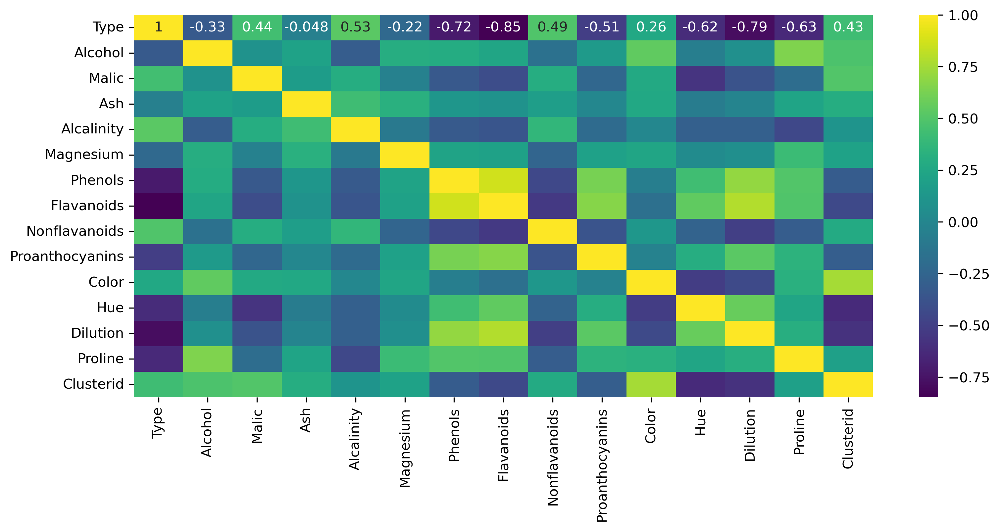

In [46]:
sns.heatmap(wine.corr(),annot=True,cmap='viridis')

**Silhouette score of k means on original data**


In [47]:
y= kmeans.fit_predict(scaled_wine_df)
y

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


array([3, 3, 3, 3, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2,
       3, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 3, 2,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 1, 1, 1, 1, 2, 1, 2,
       2, 1, 1, 2, 1, 2, 1, 2, 2, 1, 1, 1, 2, 2, 1, 2, 1, 0, 2, 1, 1, 1,
       1, 1, 1, 1, 1, 2, 2, 2, 2, 1, 2, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 2,
       2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 2, 1, 1, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0])

In [48]:
x=scaled_wine_df

In [49]:
from sklearn.metrics import silhouette_score


In [50]:
score_without_PCA = silhouette_score (x,y)         #obtained around 24% score when data was k means clustered on original data

In [51]:
score_without_PCA

0.24148107158370563

**K Means clustering on PCA data**

In [52]:
PCA_data = pd.DataFrame(pca_components)

In [53]:
PCA_data

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,-3.561968,-1.528967,-0.130558,-0.102725,0.749767,-0.241582,0.687821,0.011639,0.512705,1.068876,-0.371279,0.559975,-0.391569,0.195619
1,-2.544330,0.329993,-2.041603,-0.448040,-0.193861,-0.959958,-0.007630,0.981717,-0.320779,0.020547,-0.125640,0.350435,-0.185027,0.137040
2,-2.806546,-1.042225,1.016791,0.740693,-0.410847,0.481234,0.455990,-0.414297,-1.213945,-0.070917,-0.292712,0.045202,0.047917,-0.056468
3,-3.944287,-2.793264,-0.154956,0.634237,-0.235032,0.266787,-0.403404,0.681048,0.043371,0.118619,0.682974,-0.354389,-0.500658,0.003967
4,-1.415866,-0.953430,2.117093,-0.479292,0.254285,-0.575020,0.492906,0.392037,0.216243,0.128434,-0.573345,-0.134190,0.313438,-0.498089
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,3.575821,-2.165115,-0.378914,0.731787,-0.921869,-1.039551,0.611655,-0.171300,0.100215,-0.329309,0.112341,0.087508,-0.239865,0.096021
174,2.951568,-1.793183,0.210665,0.422008,0.142318,-0.013560,0.131525,-0.575910,-0.012272,-0.246623,0.238265,-0.314203,-0.153762,-0.031829
175,3.019601,-2.860911,-0.975719,0.509405,1.123057,0.094408,0.892320,0.019600,0.036757,-0.199549,0.599992,0.656853,0.030509,-0.057895
176,2.739308,-2.390595,-0.562449,-0.479537,0.878447,1.114849,0.896294,0.379681,-0.034488,0.512213,0.348478,0.329841,-0.192037,0.079584


In [54]:
scaled_PCA_data = scaler.fit_transform(PCA_data.iloc[:,1:])
scaled_PCA_data

array([[-0.95759815, -0.10961942, -0.10670887, ...,  1.34751368,
        -1.07045951,  0.82170224],
       [ 0.20667568, -1.71418085, -0.46541759, ...,  0.84328051,
        -0.50582177,  0.57563995],
       [-0.65274966,  0.85372358,  0.76942189, ...,  0.10877255,
         0.13099325, -0.23719421],
       ...,
       [-1.79180026, -0.81923792,  0.52916292, ...,  1.58063946,
         0.08340471, -0.2431908 ],
       [-1.49723899, -0.47224617, -0.49813642, ...,  0.79372328,
        -0.52498589,  0.33429581],
       [-1.74930076,  0.86817163,  0.547428  , ..., -0.31879603,
        -0.36862279, -1.18635876]])

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environme

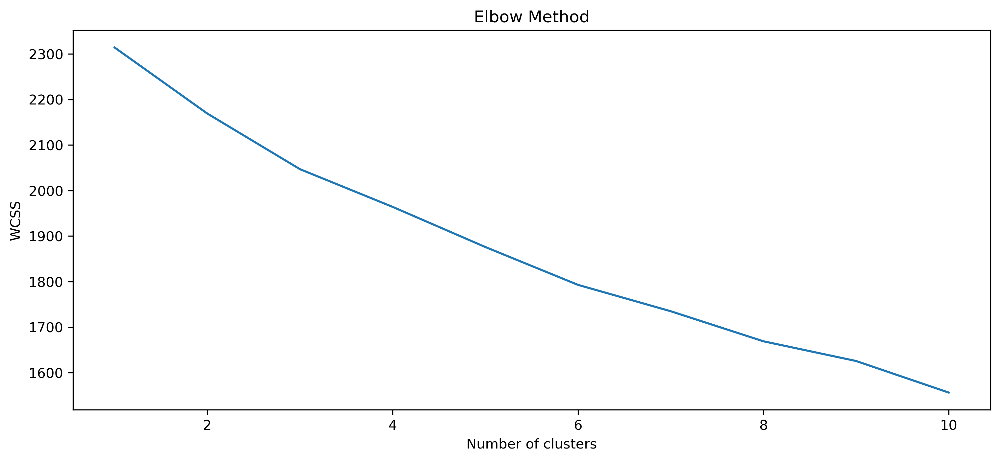

In [55]:

wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i,init='k-means++',max_iter=300,random_state=0)
    kmeans.fit(scaled_PCA_data)
    wcss.append(kmeans.inertia_)

plt.plot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [56]:
wcss

[2314.0,
 2169.031500475881,
 2046.8317072091202,
 1964.0593126860042,
 1875.9204326154086,
 1792.8105619187095,
 1734.9366838763488,
 1668.9437520596803,
 1625.6493596189289,
 1556.3449413541264]

In [57]:
kmeans = KMeans(n_clusters=4,random_state=0)
predict=kmeans.fit_predict(scaled_PCA_data)

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


In [58]:
predict

array([3, 2, 3, 2, 3, 2, 3, 2, 0, 3, 0, 1, 1, 0, 0, 2, 3, 1, 2, 3, 3, 3,
       2, 3, 3, 3, 2, 1, 3, 3, 1, 1, 1, 2, 1, 1, 2, 1, 1, 0, 3, 0, 2, 0,
       3, 0, 0, 3, 3, 3, 3, 3, 2, 2, 3, 3, 3, 2, 2, 1, 2, 1, 1, 1, 1, 2,
       1, 1, 2, 3, 1, 1, 1, 2, 2, 1, 1, 2, 3, 0, 1, 1, 1, 0, 3, 1, 1, 1,
       1, 1, 1, 1, 1, 0, 2, 0, 3, 1, 2, 0, 1, 1, 2, 1, 1, 1, 1, 1, 1, 2,
       0, 1, 2, 1, 2, 1, 1, 1, 1, 0, 2, 2, 0, 0, 0, 2, 1, 1, 1, 0, 2, 2,
       1, 0, 2, 2, 0, 0, 0, 2, 2, 2, 2, 0, 3, 0, 0, 2, 3, 3, 3, 3, 3, 3,
       3, 0, 3, 2, 3, 3, 2, 2, 2, 2, 3, 0, 3, 3, 3, 3, 2, 3, 3, 0, 0, 3,
       3, 3])

In [59]:
clusters_new2 = KMeans(n_clusters=3 , random_state=0)
new_predict2 = clusters_new2.fit_predict(scaled_PCA_data)

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


In [60]:
clusters_new2.labels_

array([0, 2, 2, 2, 0, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0,
       2, 2, 0, 0, 2, 2, 2, 0, 2, 2, 2, 2, 2, 0, 2, 2, 2, 0, 0, 2, 2, 0,
       0, 2, 2, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 2, 2, 2, 2, 0, 2, 1, 2, 2,
       1, 1, 2, 0, 2, 1, 1, 1, 1, 0, 0, 2, 0, 1, 1, 1, 1, 2, 1, 1, 1, 1,
       1, 1, 2, 0, 2, 1, 1, 2, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0,
       0, 2, 0, 2, 0, 0, 2, 2, 2, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0,
       0, 0])

In [61]:
new_predict2

array([0, 2, 2, 2, 0, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0,
       2, 2, 0, 0, 2, 2, 2, 0, 2, 2, 2, 2, 2, 0, 2, 2, 2, 0, 0, 2, 2, 0,
       0, 2, 2, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 2, 2, 2, 2, 0, 2, 1, 2, 2,
       1, 1, 2, 0, 2, 1, 1, 1, 1, 0, 0, 2, 0, 1, 1, 1, 1, 2, 1, 1, 1, 1,
       1, 1, 2, 0, 2, 1, 1, 2, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0,
       0, 2, 0, 2, 0, 0, 2, 2, 2, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0,
       0, 0])

In [62]:
wine['PCA_data_clusterid'] = new_predict2

In [63]:
wine

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline,Clusterid,PCA_data_clusterid
0,1,14.23,1.7100,2.43,15.6,127.0,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065,1,0
1,1,13.20,1.7800,2.14,11.2,100.0,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050,1,2
2,1,13.16,2.3600,2.67,18.6,101.0,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185,1,2
3,1,14.37,1.9500,2.50,16.8,113.0,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480,1,2
4,1,13.24,2.5900,2.87,21.0,118.0,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,3,13.71,5.3025,2.45,20.5,95.0,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740,2,2
174,3,13.40,3.9100,2.48,23.0,102.0,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750,2,2
175,3,13.27,4.2800,2.26,20.0,120.0,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835,2,0
176,3,13.17,2.5900,2.37,20.0,120.0,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840,2,0


In [64]:
wine.groupby('PCA_data_clusterid').agg(['mean']).reset_index()

,PCA_data_clusterid,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline,Clusterid
,,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
0,0,2.000000,13.312653,2.425306,2.381607,19.306122,107.183673,2.209796,1.866122,0.340816,1.716122,6.942449,0.853265,2.464898,748.632653,1.326531
1,1,2.000000,12.218200,2.010650,2.265375,21.121000,90.370000,2.434000,2.315400,0.342400,1.719000,2.943200,1.042925,3.018400,493.660000,0.040000
2,2,1.860759,13.302278,2.473987,2.421630,18.544937,100.474684,2.260127,1.949367,0.387215,1.421266,5.182911,0.966911,2.445316,906.088608,1.227848


<Axes: >

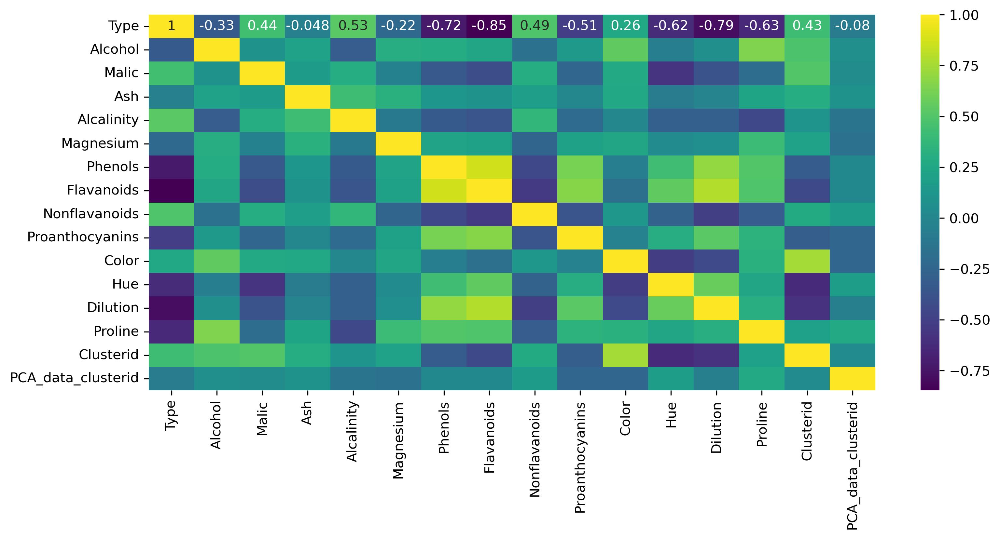

In [65]:
wine.corr()
sns.heatmap(wine.corr(),annot=True,cmap='viridis')

**Silhouette score of K Means clustered PCA data**

In [66]:
y1= kmeans.fit_predict(scaled_PCA_data)
y1

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


array([3, 2, 3, 2, 3, 2, 3, 2, 0, 3, 0, 1, 1, 0, 0, 2, 3, 1, 2, 3, 3, 3,
       2, 3, 3, 3, 2, 1, 3, 3, 1, 1, 1, 2, 1, 1, 2, 1, 1, 0, 3, 0, 2, 0,
       3, 0, 0, 3, 3, 3, 3, 3, 2, 2, 3, 3, 3, 2, 2, 1, 2, 1, 1, 1, 1, 2,
       1, 1, 2, 3, 1, 1, 1, 2, 2, 1, 1, 2, 3, 0, 1, 1, 1, 0, 3, 1, 1, 1,
       1, 1, 1, 1, 1, 0, 2, 0, 3, 1, 2, 0, 1, 1, 2, 1, 1, 1, 1, 1, 1, 2,
       0, 1, 2, 1, 2, 1, 1, 1, 1, 0, 2, 2, 0, 0, 0, 2, 1, 1, 1, 0, 2, 2,
       1, 0, 2, 2, 0, 0, 0, 2, 2, 2, 2, 0, 3, 0, 0, 2, 3, 3, 3, 3, 3, 3,
       3, 0, 3, 2, 3, 3, 2, 2, 2, 2, 3, 0, 3, 3, 3, 3, 2, 3, 3, 0, 0, 3,
       3, 3])

In [67]:
x1=scaled_PCA_data

In [68]:
from sklearn.metrics import silhouette_score


In [69]:
score_with_PCA = silhouette_score (x1,y1)  #obtained around 6% score when data was PCA component k means clustered

In [70]:
score_with_PCA

0.06847581642886377

**Comparison and Analysis**

In [71]:
wine[['PCA_data_clusterid','Clusterid']]   #clusterid is with ref from original dataset's K Means

,PCA_data_clusterid,Clusterid
0,0,1
1,2,1
2,2,1
3,2,1
4,0,1
...,...,...
173,2,2
174,2,2
175,0,2
176,0,2


In [72]:
wine[['PCA_data_clusterid','Clusterid']].value_counts()  # we can see difference between both of them

PCA_data_clusterid  Clusterid
1                   0            48
2                   1            39
                    2            29
0                   2            22
                    1            21
2                   0            11
0                   0             6
1                   1             2
Name: count, dtype: int64

**Impact of dimensionality reduction on clustering performance**

**Most clustering techniques perform better when the input dimensionality is lower. Therefore, algorithms that facilitate dimensionality reduction without sacrificing information are highly valuable**

In [73]:
score_without_PCA

0.24148107158370563

In [74]:
score_with_PCA

0.06847581642886377

we can observe this from silhouette score of original and pca data with k means clustering that **KMeans without PCA obtain the best score and KMeans with PCA score low and it reduces the value of model**  

**Conclusion and Insights**

1)key finding and insights from this is that mostly clustering performs better with low dimensions and as we can see silhouette score with original data was far better than score of PCA data clustered

2)PCA can compress data while preserving most of the original information.

Clustering finds applications in clustering tasks by reducing noise and highlighting underlying structure

3)FIRST you should use PCA in order To reduce the data dimensionality and extract the signal from data, If two principal components concentrate more than 80% of the total variance you can see the data and identify clusters in a simple scatterplotand thats how these techniques are used with datasets